# scVI Analysis of TCGA GBM scRNA-seq Data

This notebook performs batch-corrected integration and downstream analysis of 17 GBM scRNA-seq samples using **scvi-tools**.

**Pipeline overview:**
1. Data loading & QC
2. Highly variable gene selection
3. scVI model training (batch correction)
4. Latent space visualization (UMAP)
5. Leiden clustering
6. Differential expression
7. Cell type annotation with GBM markers

In [1]:
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import anndata as ad
import scanpy as sc
import scvi


warnings.filterwarnings("ignore", category=FutureWarning)

# Settings
sc.settings.verbosity = 2
sc.settings.set_figure_params(
    dpi=100, frameon=False, figsize=(6, 5), facecolor="white"
)
sc.settings.n_jobs = -1  # Use all cores on M4 Max
scvi.settings.seed = 42

# Paths
DATA_PATH = "gbm_data.h5ad"
MODEL_DIR = "scvi_model_gbm"
RESULTS_PATH = "gbm_scvi_annotated.h5ad"

print(f"scvi-tools version: {scvi.__version__}")
print(f"scanpy version: {sc.__version__}")

/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Seed set to 42


scvi-tools version: 1.3.1.post1
scanpy version: 1.11.1


In [2]:
# Load the data
adata = sc.read_h5ad(DATA_PATH)
print(adata)
print(f"\nLayers: {list(adata.layers.keys())}")
print(f"obs columns: {list(adata.obs.columns)}")

AnnData object with n_obs × n_vars = 184495 × 39853
    obs: 'SCT_snn_res.0.5', 'nCount_RNA', 'nCount_SCT', 'nFeature_RNA', 'nFeature_SCT', 'orig.ident', 'seurat_clusters', 'batch'
    layers: 'counts'

Layers: ['counts']
obs columns: ['SCT_snn_res.0.5', 'nCount_RNA', 'nCount_SCT', 'nFeature_RNA', 'nFeature_SCT', 'orig.ident', 'seurat_clusters', 'batch']


In [3]:
# Verify we have raw counts in the 'counts' layer
# scVI requires integer counts as input
counts_sample = adata.layers["counts"][:5, :5]
if hasattr(counts_sample, "toarray"):
    counts_sample = counts_sample.toarray()
print("Sample counts (should be integers):")
print(counts_sample)
print(f"\nAll integer values: {np.allclose(counts_sample, counts_sample.astype(int))}")

Sample counts (should be integers):
[[0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 1. 1. 0.]
 [0. 0. 0. 0. 0.]]

All integer values: True


In [4]:
# Ensure obs_names are unique
adata.obs_names_make_unique()
adata.var_names_make_unique()

# Ensure batch is categorical
adata.obs["batch"] = adata.obs["batch"].astype(str).astype("category")
print(f"Number of batches: {adata.obs['batch'].nunique()}")
print(f"Cells per batch:\n{adata.obs['batch'].value_counts()}")

Number of batches: 17
Cells per batch:
batch
15    17997
13    16977
3     16444
16    15121
1     13089
12    12431
2     12332
11    11938
6     11806
0      9172
4      8310
8      7762
5      7710
9      6650
10     6300
14     5631
7      4825
Name: count, dtype: int64


## 2. Quality Control & Filtering

In [5]:
# Use raw counts for QC
# Store SCT-normalized X for reference, then swap in raw counts
adata.layers["sct_normalized"] = adata.X.copy()
adata.X = adata.layers["counts"].copy()

# Identify mitochondrial and ribosomal genes by Ensembl ID patterns
# We will use the MyGene.info REST API via standard requests to map Ensembl IDs to symbols
# This requires no external libraries beyond the standard library and pandas
import requests

try:
    print("Querying MyGene.info API for gene symbols...")
    # Strip version numbers from Ensembl IDs
    adata.var["ensembl_id"] = adata.var_names
    adata.var["ensembl_id_no_version"] = adata.var_names.str.split(".").str[0]
    
    ensembl_list = adata.var["ensembl_id_no_version"].unique().tolist()
    
    # MyGene.info recommends batching POST requests (max 1000 per request)
    chunk_size = 1000
    results = []
    
    for i in range(0, len(ensembl_list), chunk_size):
        chunk = ensembl_list[i:i + chunk_size]
        res = requests.post(
            "https://mygene.info/v3/query",
            data={"q": ",".join(chunk), "scopes": "ensembl.gene", "fields": "symbol,genomic_pos.chr", "species": "human"}
        )
        if res.status_code == 200:
            results.extend(res.json())
        else:
            print(f"Warning: API request failed with status {res.status_code}")
            
    if results:
        # Handle multiple hits by taking the first one
        gene_info = pd.DataFrame(results).drop_duplicates(subset="query")
        
        # Extract chromosome properly since genomic_pos can be a list or dict
        def get_chr(row):
            pos = row.get('genomic_pos')
            if isinstance(pos, list) and len(pos) > 0:
                return pos[0].get('chr')
            elif isinstance(pos, dict):
                return pos.get('chr')
            return None
            
        gene_info['chromosome'] = gene_info.apply(get_chr, axis=1)
        
        # Merge gene info
        adata.var = adata.var.merge(
            gene_info.rename(columns={
                "query": "ensembl_id_no_version",
                "symbol": "gene_symbol"
            })[["ensembl_id_no_version", "gene_symbol", "chromosome"]],
            on="ensembl_id_no_version",
            how="left"
        )
        adata.var.index = adata.var["ensembl_id"]
        
        # Flag mitochondrial genes
        adata.var["mt"] = adata.var["chromosome"].fillna("").astype(str).str.upper() == "MT"
        adata.var["ribo"] = adata.var["gene_symbol"].fillna("").str.upper().str.match(r"^RP[SL]")
        print(f"Mapped {adata.var['gene_symbol'].notna().sum()} / {adata.n_vars} genes to symbols")
        print(f"MT genes: {adata.var['mt'].sum()}")
        print(f"Ribosomal genes: {adata.var['ribo'].sum()}")
    else:
        raise ValueError("No results returned from API")
    
except Exception as e:
    print(f"API Mapping failed: {e}. Using heuristic MT gene detection.")
    # Fallback: known human MT gene Ensembl IDs
    mt_ensembl = [
        "ENSG00000198888", "ENSG00000198763", "ENSG00000198804",
        "ENSG00000198712", "ENSG00000228253", "ENSG00000198899",
        "ENSG00000198938", "ENSG00000198840", "ENSG00000212907",
        "ENSG00000198886", "ENSG00000198786", "ENSG00000198695",
        "ENSG00000198727"
    ]
    if "ensembl_id_no_version" not in adata.var:
        adata.var["ensembl_id_no_version"] = adata.var_names.str.split(".").str[0]
    adata.var["mt"] = adata.var["ensembl_id_no_version"].isin(mt_ensembl)
    adata.var["ribo"] = False  # Can't reliably detect without symbols
    print(f"MT genes found: {adata.var['mt'].sum()}")

Querying MyGene.info API for gene symbols...
Mapped 29838 / 39853 genes to symbols
MT genes: 37
Ribosomal genes: 1031


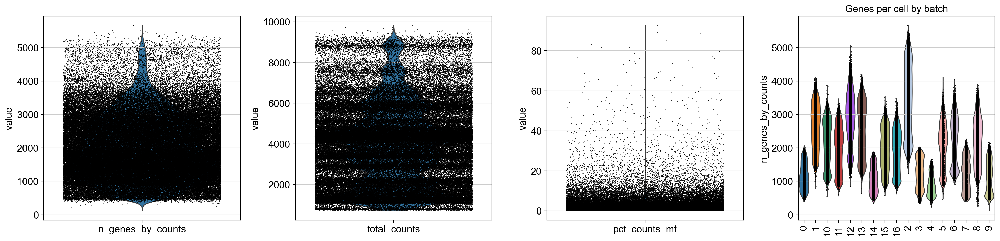

In [6]:
# Calculate QC metrics
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=True, inplace=True
)

# QC violin plots
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
sc.pl.violin(adata, "n_genes_by_counts", jitter=0.4, ax=axes[0], show=False)
sc.pl.violin(adata, "total_counts", jitter=0.4, ax=axes[1], show=False)
sc.pl.violin(adata, "pct_counts_mt", jitter=0.4, ax=axes[2], show=False)
sc.pl.violin(
    adata, "n_genes_by_counts", groupby="batch", rotation=90, ax=axes[3], show=False
)
axes[3].set_title("Genes per cell by batch")
plt.tight_layout()
plt.show()

In [7]:
# Filtering
print(f"Before filtering: {adata.n_obs} cells, {adata.n_vars} genes")

# Filter cells
sc.pp.filter_cells(adata, min_genes=200)

# Adaptive upper threshold using median absolute deviation (MAD)
from scipy.stats import median_abs_deviation

def is_outlier(adata, metric, nmads=5):
    """Flag outliers based on MAD."""
    M = adata.obs[metric]
    return (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        M > np.median(M) + nmads * median_abs_deviation(M)
    )

adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | (adata.obs["pct_counts_mt"] > 20)
)
print(f"Outlier cells flagged: {adata.obs['outlier'].sum()}")
adata = adata[~adata.obs["outlier"]].copy()

# Filter genes: present in at least 3 cells
sc.pp.filter_genes(adata, min_cells=3)

print(f"After filtering: {adata.n_obs} cells, {adata.n_vars} genes")

Before filtering: 184495 cells, 39853 genes
filtered out 1 cells that have less than 200 genes expressed
Outlier cells flagged: 1498
filtered out 74 genes that are detected in less than 3 cells
After filtering: 182996 cells, 39779 genes


## 3. Highly Variable Gene Selection

extracting highly variable genes
Highly variable genes: 4000


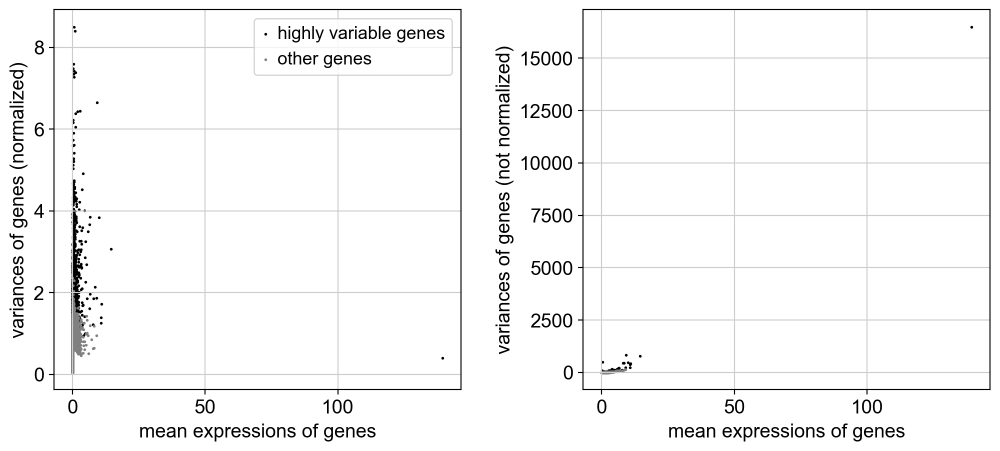

In [8]:
# Select HVGs using seurat_v3 method (works on raw counts)
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=4000,
    flavor="seurat_v3",
    batch_key="batch",
    subset=False,
    layer="counts"
)

print(f"Highly variable genes: {adata.var['highly_variable'].sum()}")

# Plot HVG selection
sc.pl.highly_variable_genes(adata)

In [9]:
# Store the full dataset in .raw before subsetting
adata.raw = adata.copy()

print(f"Full data stored in .raw: {adata.raw.n_vars} genes")
print(f"Proceeding with {adata.var['highly_variable'].sum()} HVGs for scVI")

Full data stored in .raw: 39779 genes
Proceeding with 4000 HVGs for scVI


## 4. scVI Model Setup & Training

In [10]:
# Subset to highly variable genes for model training
adata_hvg = adata[:, adata.var["highly_variable"]].copy()
print(f"HVG subset shape: {adata_hvg.shape}")

# Setup scVI model
scvi.model.SCVI.setup_anndata(
    adata_hvg,
    layer="counts",
    batch_key="batch",
)

# Initialize the model
model = scvi.model.SCVI(
    adata_hvg,
    n_latent=30,
    n_layers=2,
    gene_likelihood="nb",  # Negative binomial for count data
)

print(model)

HVG subset shape: (182996, 4000)


SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [14]:
sc.settings.num_workers = 13
scvi.settings.num_workers = 13

In [18]:
# Train the model
# Using MPS (Apple Metal) acceleration on M4 Max
model.train(
    max_epochs=400,
    early_stopping=True,
    early_stopping_patience=20,
    early_stopping_monitor="elbo_validation",
    accelerator="mps",
    devices=1,
    batch_size=256,
)

/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/scvi/train/_trainrunner.py:69: UserWarning: `accelerator` has been set to `mps`. Please note that not all PyTorch/Jax operations are supported with this backend. as a result, some models might be slower and less accurate than usuall. Please verify your analysis!Refer to https://github.com/pytorch/pytorch/issues/77764 for more details.
  accelerator, lightning_devices, device = parse_device_args(
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=13` in the `DataLoader` to improve performance.
/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_conne

Epoch 400/400: 100%|██████████| 400/400 [1:03:21<00:00,  9.50s/it, v_num=1, train_loss_step=965, train_loss_epoch=932]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [1:03:21<00:00,  9.50s/it, v_num=1, train_loss_step=965, train_loss_epoch=932]


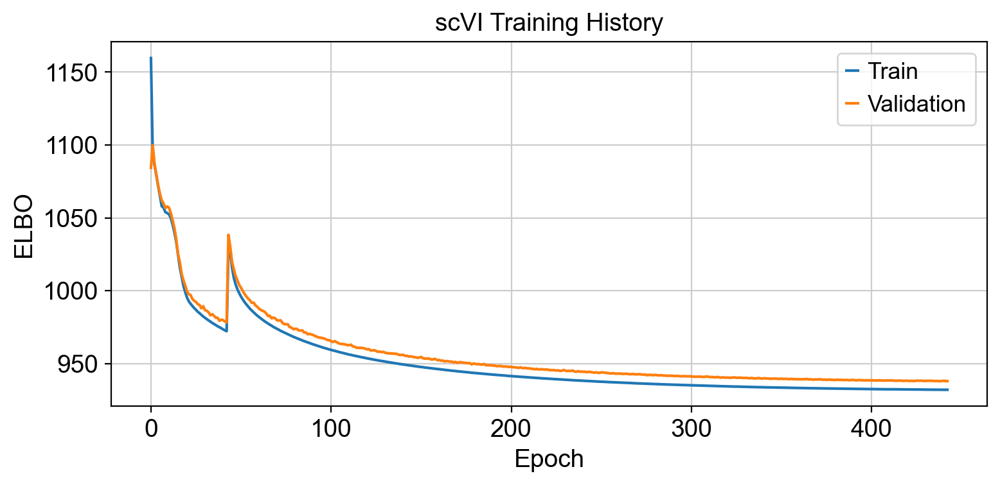

In [19]:
# Plot training history
train_elbo = model.history["elbo_train"]
val_elbo = model.history["elbo_validation"]

fig, ax = plt.subplots(1, 1, figsize=(8, 4))
ax.plot(train_elbo.index, train_elbo.values, label="Train")
ax.plot(val_elbo.index, val_elbo.values, label="Validation")
ax.set_xlabel("Epoch")
ax.set_ylabel("ELBO")
ax.set_title("scVI Training History")
ax.legend()
plt.tight_layout()
plt.show()

In [20]:
# Save the trained model
model.save(MODEL_DIR, overwrite=True)
print(f"Model saved to: {MODEL_DIR}")

# To reload later:
# model = scvi.model.SCVI.load(MODEL_DIR, adata=adata_hvg)

Model saved to: scvi_model_gbm


## 5. Latent Space & Visualization

In [21]:
# Get the latent representation
latent = model.get_latent_representation()
print(f"Latent representation shape: {latent.shape}")

# Store in the full adata object
adata.obsm["X_scVI"] = latent

# Compute neighbors and UMAP from latent space
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=30, metric="cosine")
sc.tl.umap(adata, min_dist=0.3)

Latent representation shape: (182996, 30)
computing neighbors
Epoch 35/400:   8%|▊         | 34/400 [1:17:56<13:58:58, 137.54s/it, v_num=1, train_loss_step=917, train_loss_epoch=905]
    finished (0:00:19)
computing UMAP
    finished (0:01:03)


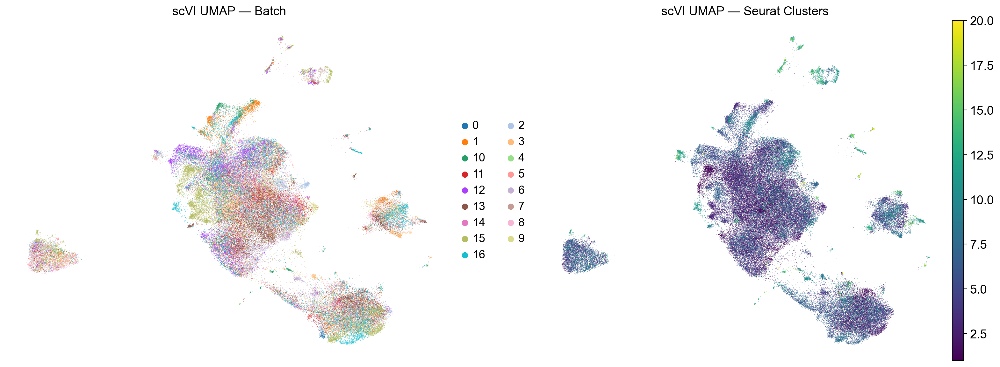

In [22]:
# Visualize UMAP colored by batch and Seurat clusters
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sc.pl.umap(
    adata, color="batch", title="scVI UMAP — Batch",
    frameon=False, ax=axes[0], show=False
)
sc.pl.umap(
    adata, color="seurat_clusters", title="scVI UMAP — Seurat Clusters",
    frameon=False, ax=axes[1], show=False
)
plt.tight_layout()
plt.show()

## 6. Leiden Clustering

In [23]:
# Leiden clustering at multiple resolutions
resolutions = [0.3, 0.5, 0.8, 1.0]
for res in resolutions:
    key = f"leiden_{res}"
    sc.tl.leiden(adata, resolution=res, key_added=key, flavor="igraph", n_iterations=2)
    print(f"Resolution {res}: {adata.obs[key].nunique()} clusters")

running Leiden clustering
    finished (0:00:06)
Resolution 0.3: 10 clusters
running Leiden clustering
    finished (0:00:06)
Resolution 0.5: 14 clusters
running Leiden clustering
    finished (0:00:06)
Resolution 0.8: 21 clusters
running Leiden clustering
    finished (0:00:06)
Resolution 1.0: 26 clusters


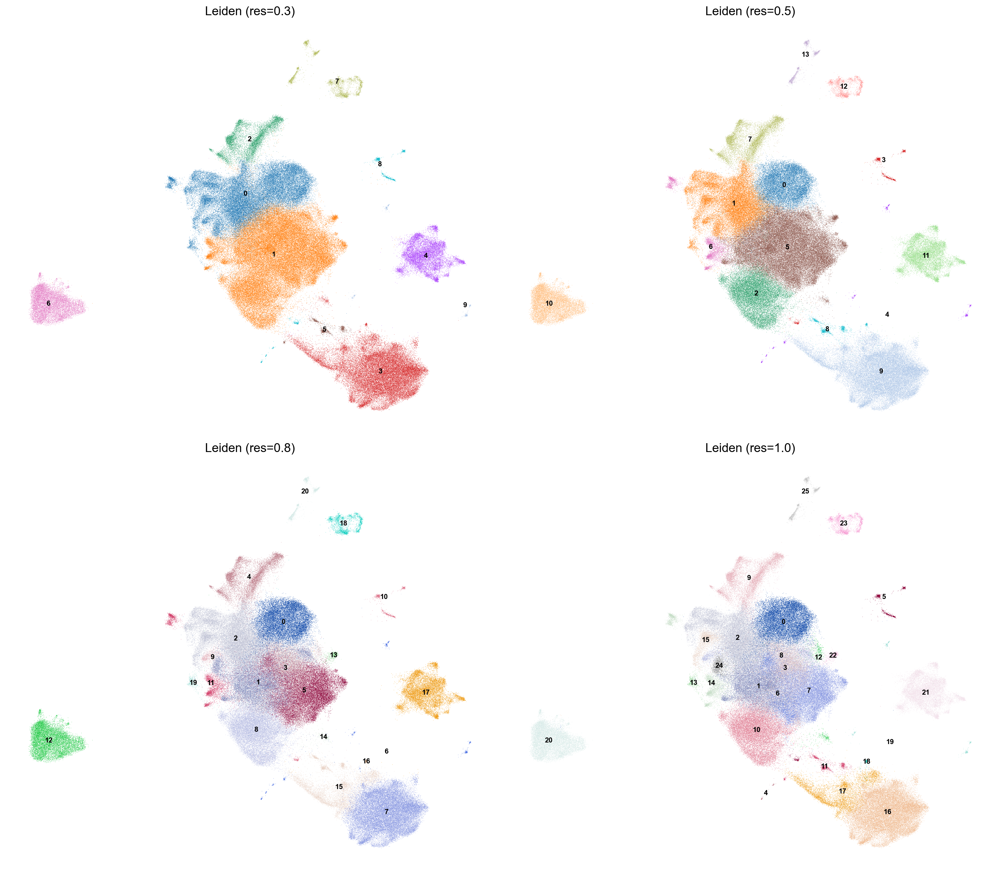

In [24]:
# Visualize different resolutions
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
for ax, res in zip(axes.flat, resolutions):
    sc.pl.umap(
        adata, color=f"leiden_{res}",
        title=f"Leiden (res={res})",
        frameon=False, ax=ax, show=False, legend_loc="on data",
        legend_fontsize=8
    )
plt.tight_layout()
plt.show()

In [25]:
# Set the primary clustering for downstream analysis
# Adjust resolution as needed after visual inspection
PRIMARY_RESOLUTION = 0.5
adata.obs["leiden"] = adata.obs[f"leiden_{PRIMARY_RESOLUTION}"]
print(f"Using Leiden resolution {PRIMARY_RESOLUTION}: {adata.obs['leiden'].nunique()} clusters")

Using Leiden resolution 0.5: 14 clusters


## 7. Differential Expression

Using scVI's built-in Bayesian differential expression, which accounts for the generative model and provides calibrated uncertainty estimates.

In [27]:
# Copy leiden labels from the full adata into the HVG subset
adata_hvg.obs["leiden"] = adata.obs["leiden"]

In [28]:
# Bayesian DE using scVI
# This tests each cluster vs. the rest
de_results = model.differential_expression(
    adata_hvg,
    groupby="leiden",
)
print(f"DE results shape: {de_results.shape}")
de_results.head(10)

DE...: 100%|██████████| 14/14 [02:03<00:00,  8.82s/it]
DE results shape: (56000, 14)


,proba_m1,proba_m2,bayes_factor,scale1,scale2,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,comparison,group1,group2
ensembl_id,,,,,,,,,,,,,,
ENSG00000171848.16,0.9694,0.0306,3.455677,0.002069,0.000097,1.441618,0.058136,0.592425,0.030818,21.510551,0.778704,0 vs Rest,0,Rest
ENSG00000186185.14,0.9686,0.0314,3.429044,0.001381,0.000075,1.312857,0.055508,0.538346,0.037438,14.997892,0.645820,0 vs Rest,0,Rest
ENSG00000136492.9,0.9656,0.0344,3.334693,0.001889,0.000166,1.551159,0.120964,0.588782,0.075433,17.942743,1.450656,0 vs Rest,0,Rest
ENSG00000139734.19,0.9654,0.0346,3.328689,0.002608,0.000172,2.483387,0.138716,0.645814,0.076930,27.270134,1.592038,0 vs Rest,0,Rest
ENSG00000090889.12,0.9628,0.0372,3.253537,0.001145,0.000078,1.002638,0.058249,0.448653,0.044812,12.097948,0.676215,0 vs Rest,0,Rest
ENSG00000118193.12,0.9600,0.0400,3.178054,0.000805,0.000056,0.782426,0.041000,0.368193,0.029592,8.961395,0.529773,0 vs Rest,0,Rest
ENSG00000131747.15,0.9592,0.0408,3.157417,0.001177,0.000079,1.427423,0.072608,0.470448,0.045698,14.716351,0.837203,0 vs Rest,0,Rest
ENSG00000088325.16,0.9572,0.0428,3.107474,0.000992,0.000068,0.843728,0.048583,0.422461,0.036032,11.186008,0.646515,0 vs Rest,0,Rest
ENSG00000182010.11,0.9556,0.0444,3.069100,0.000640,0.000057,0.640349,0.056388,0.332705,0.036313,6.245014,0.555095,0 vs Rest,0,Rest


In [30]:
# First, inspect the actual column names
print("DE result columns:", de_results.columns.tolist())
print("DE result index names:", de_results.index.names)
print(de_results.head(3))

DE result columns: ['proba_m1', 'proba_m2', 'bayes_factor', 'scale1', 'scale2', 'raw_mean1', 'raw_mean2', 'non_zeros_proportion1', 'non_zeros_proportion2', 'raw_normalized_mean1', 'raw_normalized_mean2', 'comparison', 'group1', 'group2']
DE result index names: ['ensembl_id']
                    proba_m1  proba_m2  bayes_factor    scale1    scale2  \
ensembl_id                                                                 
ENSG00000171848.16    0.9694    0.0306      3.455677  0.002069  0.000097   
ENSG00000186185.14    0.9686    0.0314      3.429044  0.001381  0.000075   
ENSG00000136492.9     0.9656    0.0344      3.334693  0.001889  0.000166   

                    raw_mean1  raw_mean2  non_zeros_proportion1  \
ensembl_id                                                        
ENSG00000171848.16   1.441618   0.058136               0.592425   
ENSG00000186185.14   1.312857   0.055508               0.538346   
ENSG00000136492.9    1.551159   0.120964               0.588782   

       

In [31]:
import numpy as np

def get_top_markers(de_df, n_top=5, lfc_threshold=0.5):
    """Extract top DE genes per cluster from scVI DE results."""
    # Compute log2 fold change from normalized means
    de_df = de_df.copy()
    de_df["lfc"] = np.log2(de_df["raw_normalized_mean1"] / de_df["raw_normalized_mean2"] + 1e-9)

    markers = {}
    groups = de_df["group1"].unique()

    for group in groups:
        group_df = de_df[de_df["group1"] == group]

        filtered = group_df[
            (group_df["lfc"] > lfc_threshold)
            & (group_df["bayes_factor"] > 3)
        ].sort_values("bayes_factor", ascending=False)

        markers[str(group)] = filtered.head(n_top).index.tolist()

    return markers

top_markers = get_top_markers(de_results, n_top=5)
for cluster, genes in top_markers.items():
    print(f"Cluster {cluster}: {genes}")


Cluster 0: ['ENSG00000171848.16', 'ENSG00000186185.14', 'ENSG00000136492.9', 'ENSG00000139734.19', 'ENSG00000090889.12']
Cluster 1: []
Cluster 2: []
Cluster 3: ['ENSG00000249669.10', 'ENSG00000112214.10', 'ENSG00000249797.2', 'ENSG00000137831.15', 'ENSG00000118407.15']
Cluster 4: ['ENSG00000211945.2', 'ENSG00000211956.2', 'ENSG00000211947.2', 'ENSG00000211666.2', 'ENSG00000211893.4']
Cluster 5: []
Cluster 6: []
Cluster 7: ['ENSG00000221866.9', 'ENSG00000203688.6', 'ENSG00000186487.20', 'ENSG00000272168.8', 'ENSG00000077264.15']
Cluster 8: ['ENSG00000090382.7', 'ENSG00000021355.13', 'ENSG00000163563.8', 'ENSG00000140379.9', 'ENSG00000158869.11']
Cluster 9: ['ENSG00000120594.17', 'ENSG00000231131.8', 'ENSG00000128815.19', 'ENSG00000152315.5', 'ENSG00000198223.17']
Cluster 10: ['ENSG00000150656.15', 'ENSG00000135525.18', 'ENSG00000227392.2', 'ENSG00000091513.16', 'ENSG00000158865.12']
Cluster 11: ['ENSG00000160654.11', 'ENSG00000182866.17', 'ENSG00000141293.16', 'ENSG00000116824.5', 'ENSG

normalizing counts per cell
    finished (0:00:01)
computing PCA


/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 39779 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


    with n_comps=50


/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/sklearn/utils/sparsefuncs.py:736: RuntimeWarning: divide by zero encountered in matmul
  matvec=lambda x: X @ x - offset @ x,
/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/sklearn/utils/sparsefuncs.py:736: RuntimeWarning: overflow encountered in matmul
  matvec=lambda x: X @ x - offset @ x,
/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/sklearn/utils/sparsefuncs.py:736: RuntimeWarning: invalid value encountered in matmul
  matvec=lambda x: X @ x - offset @ x,


    finished (0:00:11)
Storing dendrogram info using `.uns['dendrogram_leiden']`


/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/sklearn/utils/sparsefuncs.py:737: RuntimeWarning: divide by zero encountered in matmul
  matmat=lambda x: X @ x - offset @ x,
/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/sklearn/utils/sparsefuncs.py:737: RuntimeWarning: overflow encountered in matmul
  matmat=lambda x: X @ x - offset @ x,
/opt/anaconda3/envs/gbm_scrna/lib/python3.12/site-packages/sklearn/utils/sparsefuncs.py:737: RuntimeWarning: invalid value encountered in matmul
  matmat=lambda x: X @ x - offset @ x,


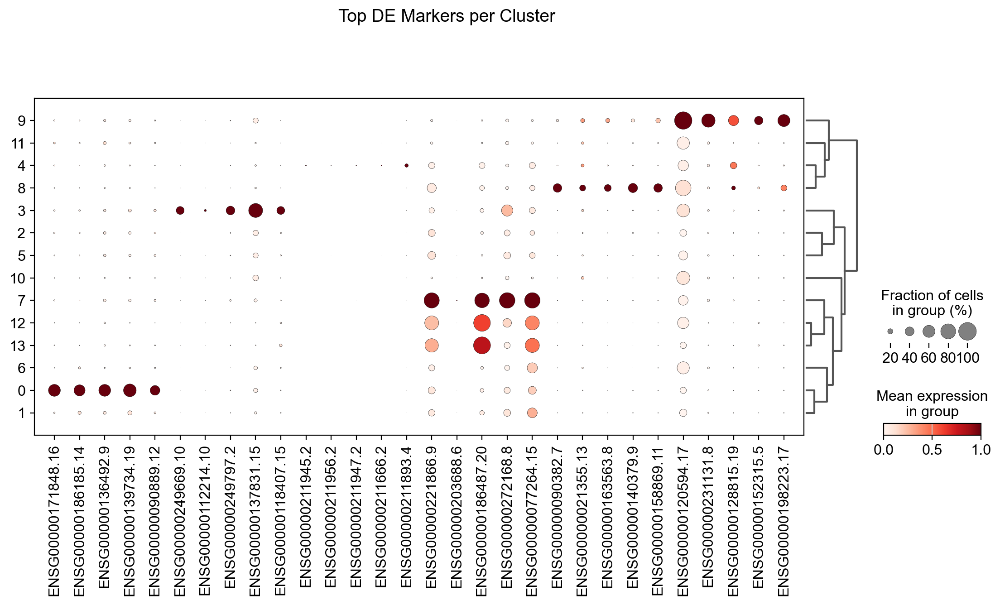

In [33]:
# For visualization, normalize the data (log1p) for plotting
adata_plot = adata.copy()
sc.pp.normalize_total(adata_plot, target_sum=1e4)
sc.pp.log1p(adata_plot)

# Collect all unique marker genes for dotplot
all_markers = []
for genes in top_markers.values():
    all_markers.extend(genes)
all_markers = list(dict.fromkeys(all_markers))  # Remove duplicates, preserve order

# Dotplot of top markers
if all_markers:
    # Filter to genes that exist in the data
    valid_markers = [g for g in all_markers if g in adata_plot.var_names]
    if valid_markers:
        sc.pl.dotplot(
            adata_plot, var_names=valid_markers[:30], groupby="leiden",
            dendrogram=True, standard_scale="var",
            title="Top DE Markers per Cluster"
        )

## 8. Cell Type Annotation

Annotating clusters using canonical GBM and brain cell type markers.

In [34]:
# Define canonical marker genes for GBM cell types
# We need to map gene symbols to Ensembl IDs for scoring

marker_genes_symbols = {
    "Tumor/Neoplastic": ["EGFR", "PDGFRA", "SOX2", "NES", "CDK4", "IDH1"],
    "Macrophage/Microglia": ["CD68", "AIF1", "CX3CR1", "TMEM119", "P2RY12", "ITGAM"],
    "T cells": ["CD3D", "CD3E", "CD8A", "CD4", "IL7R"],
    "Oligodendrocytes": ["MBP", "PLP1", "MOG", "OLIG2"],
    "Endothelial": ["PECAM1", "VWF", "CDH5", "FLT1"],
    "Astrocytes": ["GFAP", "AQP4", "S100B", "SLC1A3"],
    "Neurons": ["RBFOX3", "SYP", "SNAP25", "STMN2"],
    "Pericytes": ["PDGFRB", "RGS5", "ACTA2"],
}

# Map gene symbols to Ensembl IDs
if "gene_symbol" in adata.var.columns:
    symbol_to_ensembl = adata.var.dropna(subset=["gene_symbol"]).set_index("gene_symbol")["ensembl_id"].to_dict()
    
    marker_genes_ensembl = {}
    for cell_type, symbols in marker_genes_symbols.items():
        ensembl_ids = [symbol_to_ensembl[s] for s in symbols if s in symbol_to_ensembl]
        if ensembl_ids:
            marker_genes_ensembl[cell_type] = ensembl_ids
            mapped = [s for s in symbols if s in symbol_to_ensembl]
            unmapped = [s for s in symbols if s not in symbol_to_ensembl]
            print(f"{cell_type}: mapped {len(mapped)}/{len(symbols)} — missing: {unmapped}")
        else:
            print(f"{cell_type}: NO genes mapped!")
else:
    print("No gene_symbol column found. Skipping marker-based annotation.")
    print("Ensure the MyGene.info mapping cell succeeded.")
    marker_genes_ensembl = {}

Tumor/Neoplastic: mapped 6/6 — missing: []
Macrophage/Microglia: mapped 6/6 — missing: []
T cells: mapped 5/5 — missing: []
Oligodendrocytes: mapped 4/4 — missing: []
Endothelial: mapped 4/4 — missing: []
Astrocytes: mapped 4/4 — missing: []
Neurons: mapped 4/4 — missing: []
Pericytes: mapped 3/3 — missing: []


In [35]:
# Score cells for each cell type using sc.tl.score_genes
if marker_genes_ensembl:
    for cell_type, genes in marker_genes_ensembl.items():
        valid_genes = [g for g in genes if g in adata_plot.var_names]
        if len(valid_genes) >= 2:
            sc.tl.score_genes(
                adata_plot, gene_list=valid_genes,
                score_name=f"score_{cell_type}",
                use_raw=False
            )
            # Copy scores back to main adata
            adata.obs[f"score_{cell_type}"] = adata_plot.obs[f"score_{cell_type}"]
            print(f"Scored: {cell_type} ({len(valid_genes)} genes)")
        else:
            print(f"Skipped {cell_type}: only {len(valid_genes)} valid genes")

computing score 'score_Tumor/Neoplastic'
    finished (0:00:03)
Scored: Tumor/Neoplastic (6 genes)
computing score 'score_Macrophage/Microglia'
    finished (0:00:02)
Scored: Macrophage/Microglia (6 genes)
computing score 'score_T cells'
    finished (0:00:02)
Scored: T cells (5 genes)
computing score 'score_Oligodendrocytes'
    finished (0:00:02)
Scored: Oligodendrocytes (4 genes)
computing score 'score_Endothelial'
    finished (0:00:02)
Scored: Endothelial (4 genes)
computing score 'score_Astrocytes'
    finished (0:00:02)
Scored: Astrocytes (4 genes)
computing score 'score_Neurons'
    finished (0:00:02)
Scored: Neurons (4 genes)
computing score 'score_Pericytes'
    finished (0:00:02)
Scored: Pericytes (3 genes)


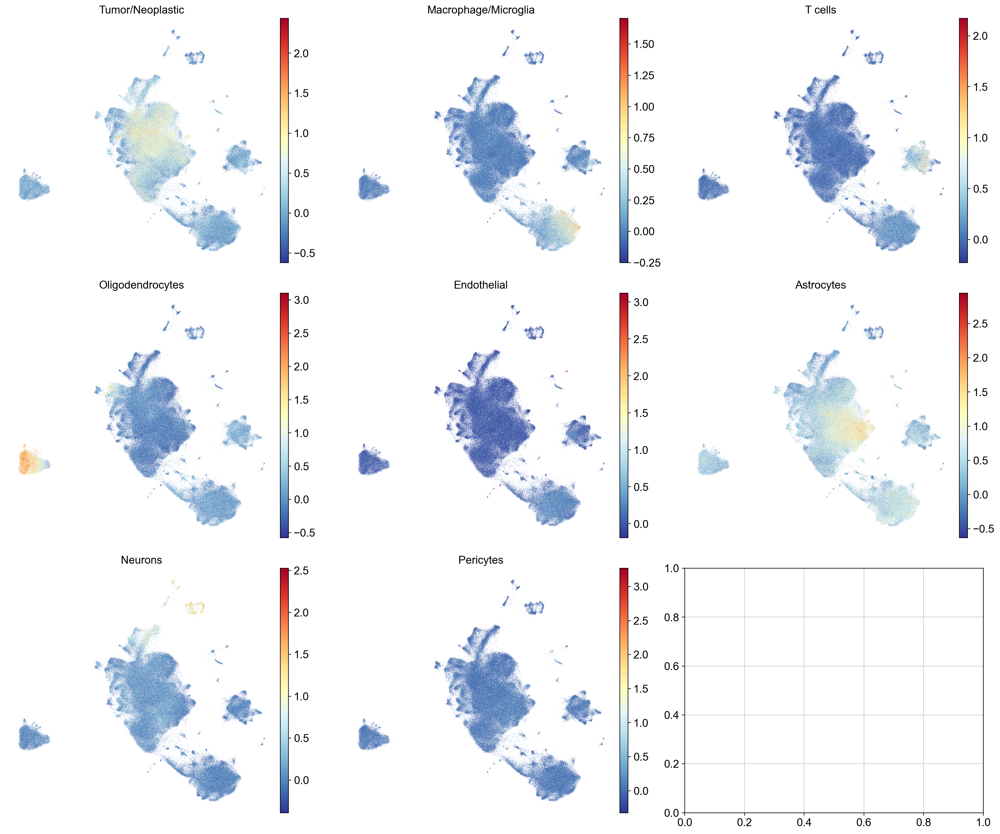

In [36]:
# Visualize cell type scores on UMAP
score_cols = [c for c in adata.obs.columns if c.startswith("score_")]
if score_cols:
    n_scores = len(score_cols)
    n_cols = 3
    n_rows = (n_scores + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    axes = axes.flat if n_scores > 1 else [axes]
    
    for ax, col in zip(axes, score_cols):
        cell_type = col.replace("score_", "")
        sc.pl.umap(
            adata, color=col, title=cell_type,
            frameon=False, ax=ax, show=False, color_map="RdYlBu_r"
        )
    # Hide unused axes
    for ax in list(axes)[len(score_cols):]:
        ax.set_visible(False)
    
    plt.tight_layout()
    plt.show()

Cell type distribution:
cell_type
Astrocytes              74425
Tumor/Neoplastic        39904
Oligodendrocytes        19327
Neurons                 17500
Macrophage/Microglia     8554
T cells                  8477
Endothelial              7579
Pericytes                7230
Name: count, dtype: int64


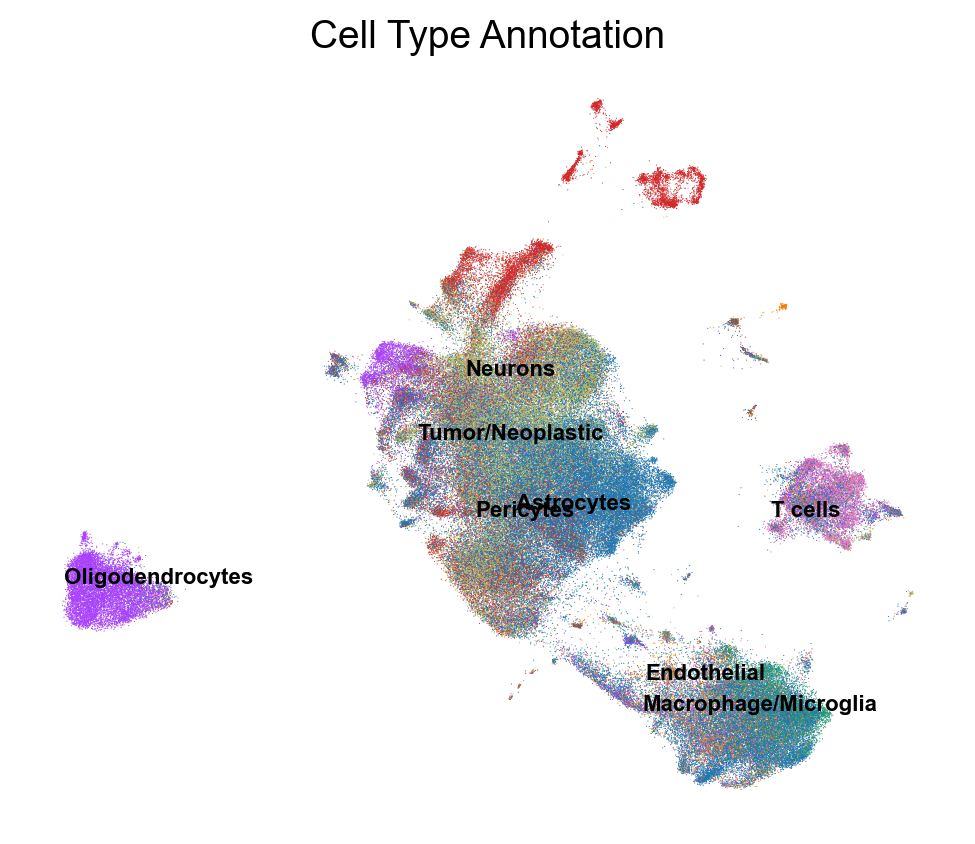

In [37]:
# Assign cell type labels based on highest score per cell
if score_cols:
    score_df = adata.obs[score_cols].copy()
    score_df.columns = [c.replace("score_", "") for c in score_df.columns]
    
    adata.obs["cell_type"] = score_df.idxmax(axis=1)
    adata.obs["cell_type_confidence"] = score_df.max(axis=1)
    
    print("Cell type distribution:")
    print(adata.obs["cell_type"].value_counts())
    
    # UMAP colored by cell type
    sc.pl.umap(
        adata, color="cell_type",
        title="Cell Type Annotation",
        frameon=False, legend_loc="on data", legend_fontsize=8
    )

Available genes in adata_sym: 39779
Kept markers: 36
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`


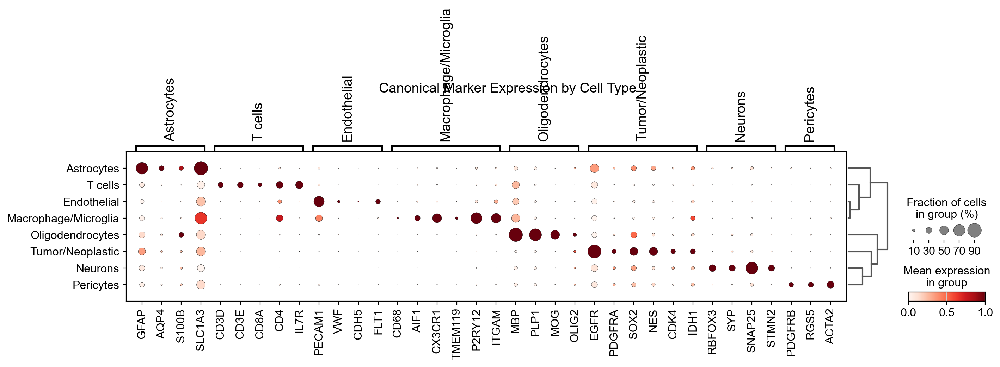

In [45]:
# Dotplot of marker genes by cell type
if marker_genes_ensembl and "gene_symbol" in adata.var.columns:
    adata_sym = adata_plot.copy()

    # Build a clean symbol mapping: gene_symbol if valid, else keep Ensembl ID
    symbol_map = {}
    for ens_id in adata_sym.var_names:
        raw = adata_sym.var.loc[ens_id, "gene_symbol"]
        # Guard against NaN, None, "nan", or empty strings
        if isinstance(raw, str) and raw not in ("", "nan"):
            symbol_map[ens_id] = raw
        else:
            symbol_map[ens_id] = ens_id  # keep Ensembl ID as fallback

    # De-duplicate the symbols
    seen = {}
    unique_names = []
    for ens_id in adata_sym.var_names:
        name = symbol_map[ens_id]
        if name in seen:
            seen[name] += 1
            unique_names.append(f"{name}_{seen[name]}")
        else:
            seen[name] = 0
            unique_names.append(name)

    adata_sym.var_names = pd.Index(unique_names)
    adata_sym.obs["cell_type"] = adata.obs["cell_type"].values

    # Filter markers to ONLY those present in adata_sym
    available = set(adata_sym.var_names.tolist())
    filtered_markers = {}
    dropped = []
    for ct, genes in marker_genes_symbols.items():
        valid = [g for g in genes if g in available]
        missing = [g for g in genes if g not in available]
        dropped.extend(missing)
        if valid:
            filtered_markers[ct] = valid

    print(f"Available genes in adata_sym: {len(available)}")
    print(f"Kept markers: {sum(len(v) for v in filtered_markers.values())}")
    if dropped:
        print(f"Dropped {len(dropped)} missing markers: {dropped}")

    # Double-check — this must be empty
    all_marker_genes = [g for genes in filtered_markers.values() for g in genes]
    still_missing = [g for g in all_marker_genes if g not in available]
    assert len(still_missing) == 0, f"BUG: still missing genes: {still_missing}"

    if filtered_markers:
        sc.pl.dotplot(
            adata_sym, var_names=filtered_markers, groupby="cell_type",
            use_raw=False,
            dendrogram=True, standard_scale="var",
            title="Canonical Marker Expression by Cell Type"
        )
    else:
        print("No valid marker genes found after filtering.")


## 9. Save Results

In [46]:
# Save the annotated AnnData
# Drop the .raw to reduce file size (can be reconstructed)
adata_save = adata.copy()

# Remove plotting-only layers to save space
if "sct_normalized" in adata_save.layers:
    del adata_save.layers["sct_normalized"]

adata_save.write(RESULTS_PATH, compression="gzip")
print(f"Annotated data saved to: {RESULTS_PATH}")
print(f"File size: {os.path.getsize(RESULTS_PATH) / 1e9:.2f} GB")
print(f"\nFinal object:")
print(adata_save)

Annotated data saved to: gbm_scvi_annotated.h5ad
File size: 2.97 GB

Final object:
AnnData object with n_obs × n_vars = 182996 × 39779
    obs: 'SCT_snn_res.0.5', 'nCount_RNA', 'nCount_SCT', 'nFeature_RNA', 'nFeature_SCT', 'orig.ident', 'seurat_clusters', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'outlier', 'leiden_0.3', 'leiden_0.5', 'leiden_0.8', 'leiden_1.0', 'leiden', 'score_Tumor/Neoplastic', 'score_Macrophage/Microglia', 'score_T cells', 'score_Oligodendrocytes', 'score_Endothelial', 'score_Astrocytes', 'score_Neurons', 'score_Pericytes', 'cell_type', 'cell_type_confidence'
    var: 'ensembl_id', 'ensembl_id_no_version', 'gene_symbol', 'chromosome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', '

In [47]:
# Summary
print("=" * 60)
print("ANALYSIS SUMMARY")
print("=" * 60)
print(f"Input cells:  {184495}")
print(f"Final cells:  {adata.n_obs}")
print(f"Final genes:  {adata.n_vars}")
print(f"HVGs used:    {adata.var['highly_variable'].sum()}")
print(f"Latent dims:  {adata.obsm['X_scVI'].shape[1]}")
print(f"Clusters:     {adata.obs['leiden'].nunique()}")
if "cell_type" in adata.obs.columns:
    print(f"Cell types:   {adata.obs['cell_type'].nunique()}")
print(f"\nSaved model:  {MODEL_DIR}/")
print(f"Saved data:   {RESULTS_PATH}")
print("=" * 60)

ANALYSIS SUMMARY
Input cells:  184495
Final cells:  182996
Final genes:  39779
HVGs used:    4000
Latent dims:  30
Clusters:     14
Cell types:   8

Saved model:  scvi_model_gbm/
Saved data:   gbm_scvi_annotated.h5ad
